### 🎯 데이터 마트 기반 분석 방향 및 계획
#### ✅ 분석 목적 요약
- 판매 마트(Sales Mart): 제품·판매자·주문 정보 중심의 매출 분석

- 고객 마트(Customer Mart): 고객·지역·리뷰·결제 금액 중심의 고객 분석

> 판매 및 고객 데이터를 통합 분석하여, 인사이트 기반의 전략 도출 및 대시보드 시각화를 목표로 함

| 마트 유형                        | 분석 초점                     | 활용 목적                           |
| ---------------------------- | ------------------------- | ------------------------------- |
| 🧾 **판매 마트** (Sales Mart)    | 제품, 판매자, 주문 중심의 매출 분석     | - 매출 기여 제품·판매자 파악<br>- 판매 전략 수립 |
| 👥 **고객 마트** (Customer Mart) | 고객, 지역, 결제 금액, 리뷰 등 고객 분석 | - 주요 고객층 식별<br>- 마케팅/리텐션 전략 수립  |


### 1. 판매 마트 기반 분석
##### 판매 마트 기반 주요 분석 주제

| 분석 주제           | 설명                                  | 활용 KPI                     |
|--------------------|---------------------------------------|------------------------------|
| 📅 월별 매출 추이   | 월별 총매출, 평균 주문 수 확인        | 총매출, AOV, 주문 수         |
| 🏷️ 카테고리별 성과 | 제품 카테고리별 매출 비교             | 카테고리별 매출, 판매량      |
| 🧾 판매자 분석      | 판매자별 매출, 주문 수, 순위 분석      | 판매자별 GMV, 판매량         |
| 🌎 지역별 성과      | 판매자 지역(주 단위) 기반 매출 분석    | 지역별 매출, 평균 주문 수    |


#### 데이터 불러오기

In [112]:
import os
from dotenv import load_dotenv
from sqlalchemy import create_engine
import pandas as pd
import numpy as np

# env 파일 불러오기
load_dotenv()

# 환경설정
user = os.getenv("DB_USER")
password = os.getenv("DB_PASSWORD")
host = os.getenv("DB_HOST")
port = os.getenv("DB_PORT")
database = os.getenv("DB_NAME")

In [113]:
# 데이터 불러오기
engine = create_engine(f"mysql+pymysql://{user}:{password}@{host}:{port}/olist_dm")

# 테이블 직접 불러오기 (모든 컬럼)
df_sales = pd.read_sql_table("fact_sales", con=engine)
df_product = pd.read_sql_table("dim_product", con=engine)
df_seller = pd.read_sql_table("dim_seller", con=engine)
df_fact_sales = pd.read_sql_table("fact_sales", con=engine)
df_order_status = pd.read_sql_table("dim_order_status", con=engine)
df_date = pd.read_sql_table("dim_date", con=engine)
df_customer_orders = pd.read_sql_table("fact_customer_orders", con=engine)
df_customer = pd.read_sql_table('dim_customer', con=engine)
df_geolocation = pd.read_sql_table('dim_geolocation', con=engine)

#### 총 주문수

In [114]:
# 총 주문수
min_date = df_sales['order_date'].min().strftime('%Y-%m-%d')
max_date = df_sales['order_date'].max().strftime('%Y-%m-%d')
print(f"{min_date} ~ {max_date}")
print(f"{df_sales.order_id.count():,} 건")

2016-09-04 ~ 2018-09-03
111,382 건


##### 총 매출

In [115]:
# 총 매출
print(f"{float(df_sales[['price', 'freight_value']].sum().sum()):,.2f} BRL")

15,596,903.09 BRL


##### 평균 주문 금액

In [116]:
# sum_amount / order_id
df_sales.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value,order_status,order_date
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,delivered,2017-09-13
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,delivered,2017-04-26
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,delivered,2018-01-14
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,delivered,2018-08-08
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,delivered,2017-02-04


In [117]:
df_sales['total_amount'] = df_sales['price'] + df_sales['freight_value']
total_amount = float(df_sales.groupby(by='order_id').agg(
    total_amount_sum = ('total_amount', 'sum')
).reset_index()['total_amount_sum'].sum())
print(f"{total_amount:,.2f} BRL")

15,596,903.09 BRL


In [118]:
count = pd.read_sql_query("SELECT COUNT(DISTINCT order_id) AS order_cnt FROM fact_sales", con=engine)
cnt_value = count.iloc[0]['order_cnt']
print(cnt_value)

97584


In [119]:
print(f"평균 주문 금액(한번 주문할 때 주문 금액): {total_amount/cnt_value:,.2f} BRL")

평균 주문 금액(한번 주문할 때 주문 금액): 159.83 BRL


##### 총 판매 수량

In [120]:
total_quantity = df_sales['order_item_id'].count()
print(f"총 판매 수량: {total_quantity:,}개")

총 판매 수량: 111,382개


##### 평균 주문당 제품 수

In [121]:
# 평균 주문당 제품 수
print(f"평균 1주문당 {float(total_quantity / cnt_value):.2f}건")

평균 1주문당 1.14건


##### 월별 및 주문 트렌드 분석
> 매출이 늘고 있는가? 계절성이 있는가?

In [122]:
# 월별 매출 및 주문 트렌드 분석
df_sales['order_y_mth'] = df_sales['order_date'].dt.strftime('%Y-%m')

In [123]:
viz_y_mth = df_sales.groupby('order_y_mth').agg(
    total_amount = ('total_amount', 'sum')
).reset_index()

In [124]:
import plotly.express as px

fig = px.line(viz_y_mth, x="order_y_mth", y="total_amount")
fig.show()

#### 📈 월별 총매출 추이 분석 (order_y_mth 기준)

##### ✅ 시각화 개요
분석 대상: Brazilian E-Commerce 데이터셋 (olist_dm.fact_sales)  

분석 기준: 월별 주문일(order_date)을 기준으로 집계  

측정 지표: 주문 1건 단위로 합산된 price + freight_value = total_amount  

##### 🧾 주요 인사이트
기간	특징
2016년 하반기	플랫폼 초기 단계, 매출 규모 작음  
2017년 전반기	지속적인 성장, 월간 매출 60만 BRL 이상  
2017년 하반기	10~11월 급격한 성장, 월 매출 100만 BRL 돌파  
2018년 상반기	안정적 고점 유지, 최고 매출은 2018년 3월 (약 1.2M BRL)  
2018년 하반기	9월 이후 데이터 급감 → 데이터 누락 또는 수집 중단 가능성 있음  

##### 🔍 분석 포인트
성장 구간: 2017년 1월부터 2018년 3월까지 지속적인 상승세  

계절성: 2017년 10월 및 2018년 초반은 성수기 가능성 (추가 확인 필요)  

이상 구간: 2018년 9월 이후 급락 → 전체 주문 수 감소 여부와 비교 분석 필요  

##### 📌 향후 분석 아이디어
월별 주문 수량, 평균 주문 금액, 카테고리별 매출로 세분화  

요일/시간대 기반 주문 트렌드 분석  

이벤트 기간(블랙프라이데이, 연말 세일 등) 매출 변화 여부 확인  

##### 상품 카테고리별 매출 기여도
> 어떤 제품군이 매출을 이끄는가?

In [125]:
df_sales_product = pd.merge(df_sales, df_product, how='left', on='product_id')
df_sales_product.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value,order_status,order_date,total_amount,order_y_mth,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,delivered,2017-09-13,72.19,2017-09,cool_stuff,650.0,28.0,9.0,14.0,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,delivered,2017-04-26,259.83,2017-04,pet_shop,30000.0,50.0,30.0,40.0,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,delivered,2018-01-14,216.87,2018-01,moveis_decoracao,3050.0,33.0,13.0,33.0,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,delivered,2018-08-08,25.78,2018-08,perfumaria,200.0,16.0,10.0,15.0,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,delivered,2017-02-04,218.04,2017-02,ferramentas_jardim,3750.0,35.0,40.0,30.0,garden_tools


In [126]:
fig = px.bar(df_sales_product.groupby('product_category_name').agg(
    cat_total_amount = ('total_amount', 'sum')
        ).reset_index()
        .sort_values(by='cat_total_amount', ascending=False)[:20]
        , x='product_category_name', y='cat_total_amount')
fig.show()

#### 📊 상위 20개 카테고리별 총 매출 분석
##### ✅ 시각화 개요  
데이터 출처: Brazilian E-Commerce 데이터 (olist_dm.fact_sales + dim_product)  

분석 목적: 상품 카테고리별 매출 기여도 파악  

집계 지표: 총 매출 합계 (price + freight_value)  

정렬 기준: 내림차순 기준 상위 20개 카테고리만 추출  

##### 🧾 주요 인사이트  
순위	카테고리	총 매출 (BRL 기준)	비고  
1위	beleza_saude (뷰티·건강)	1.4M+	압도적 1위  
2위	relogios_presentes (시계·선물)	1.3M+	고가 상품 추정  
3위	cama_mesa_banho (침구류 등)	1.25M+	가정용 인기  
4~6위	esporte_lazer, informatica_acessorios, moveis_decoracao	1M 내외	계절성 및 생활 필수품  

##### 🔍 분석 포인트  
상위 5개 카테고리가 매출의 큰 비중을 차지 → 판매 집중 전략 가능  

beleza_saude는 월등한 매출 규모 → 주력 상품군 또는 고객 충성도 높을 가능성  

unknown은 데이터 정합성 문제 가능성 → 전처리 점검 필요  



##### 판매자 분석(판매량 많은 Top 셀러는?)

In [127]:
df_sales_seller = pd.merge(df_sales, df_seller, how='left', on='seller_id')
df_sales_seller.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value,order_status,order_date,total_amount,order_y_mth,seller_zip_code_prefix,geolocation_city,geolocation_state,geolocation_lat,geolocation_lng
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,delivered,2017-09-13,72.19,2017-09,27277,None,None,NaN,NaN
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,delivered,2017-04-26,259.83,2017-04,3471,sao paulo,SP,-23.565096,-46.518565
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,delivered,2018-01-14,216.87,2018-01,37564,borda da mata,MG,-22.262584,-46.171124
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,delivered,2018-08-08,25.78,2018-08,14403,franca,SP,-20.553624,-47.387359
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,delivered,2017-02-04,218.04,2017-02,87900,loanda,PR,-22.929384,-53.135873


In [128]:
df_seller_rank = (
    df_sales
    .merge(df_seller, on='seller_id')
    .groupby(['seller_id', 'geolocation_city'])
    .agg(total_selling=('price', 'sum'))
    .reset_index()
    .sort_values('total_selling', ascending=False)
    .head(20)
)

In [129]:
df_seller_rank['seller_label'] = df_seller_rank['geolocation_city'] + ' (' + df_seller_rank['seller_id'].str[:6] + '...)'

fig = px.bar(
    df_seller_rank,
    x='seller_label',
    y='total_selling',
    text='total_selling',
    title='상위 20 판매자별 총 매출',
    labels={'label': '판매자 (도시)', 'total_selling': '총 매출 (BRL)'},
    template='plotly_white'
)

fig.update_traces(
    texttemplate='%{text:,.0f}',
    textposition='outside',
    cliponaxis=False  # 🔥 중요! 텍스트가 잘리지 않게 함
)

fig.update_layout(
    margin=dict(t=80),  # top margin 늘리기
    uniformtext_minsize=8,
    title='상위 20 판매자별 총 매출',
    title_x=0.5
)

fig.show()

#### 🛍️ 판매자별 총 매출 상위 20인 분석

##### ✅ 개요
- **분석 대상**: 판매자(`seller_id`)별 총 매출 합계(`price`)
- **집계 기준**: 주문 내역(`fact_sales`) 기준
- **시각화 방식**: 수직 막대 그래프 (Top 20 판매자 기준)

##### 🧾 주요 특징
- `seller_id`는 해시 형태로 익명화되어 있으나, 일부 ID는 월등한 매출 성과를 보임
- 상위 판매자 중 1~3위는 20만~25만 BRL 이상의 매출 기록
- 동일 seller_id가 다른 판매자들과 큰 격차를 보이는 것은 제품 수, 단가, 재구매율과 관련될 수 있음

In [130]:
df_region_sales = (
    df_sales
    .merge(df_seller, on='seller_id')
    .groupby(['geolocation_state'])  # 또는 'seller_city'
    .agg(total_amount=('price', 'sum'))
    .reset_index()
    .sort_values('total_amount', ascending=False)
)

In [131]:
df_region_sales.rename(columns={'geolocation_state': 'seller_state'}, inplace=True)

In [132]:
import requests

# 브라질 주 GeoJSON 파일 로드
geojson_url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
brazil_states = requests.get(geojson_url).json()

states_in_geojson = [
    feature["properties"]["sigla"] for feature in brazil_states["features"]
]

In [133]:
# 모든 주 목록 DataFrame
df_all_states = pd.DataFrame({'seller_state': states_in_geojson})

# 기존 매출 데이터 병합 (없는 주는 NaN → 0으로 채움)
df_full_sales = df_all_states.merge(df_region_sales, on='seller_state', how='left')
df_full_sales['total_amount'] = df_full_sales['total_amount'].fillna(0)

In [134]:
fig = px.choropleth(
    df_full_sales,
    geojson=brazil_states,
    locations='seller_state',
    featureidkey='properties.sigla',
    color='total_amount',
    color_continuous_scale='YlOrRd',
    labels={'total_amount': '총 매출 (BRL)'},
    title='브라질 주(State)별 총 판매 금액'
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":60,"l":0,"b":0}, title_x=0.5)
fig.show()

##### 운송비 분석
> 운송비가 평균보다 높은 주문은 어떤 특징이 있는가?

In [135]:
df_customer.columns = ['customer_id', 'customer_unique_id', 'geolocation_zip_code_prefix', 'geolocation_city', 'geolocation_state']
merge_df = pd.merge(df_sales, df_seller, how='left', on='seller_id')
merge_df.columns = ['order_id', 'order_item_id', 'product_id', 'seller_id', 'price',
        'freight_value', 'order_status', 'order_date', 'total_amount', 'order_y_mth','seller_zip_code_prefix',
        'seller_city', 'seller_state', 'seller_lat',
        'seller_lng']
merge_df = pd.merge(merge_df, df_customer_orders, how='left', on=['order_id', 'order_date'])
merge_df = pd.merge(merge_df, df_customer, how='left', on='customer_id')
merge_df = pd.merge(merge_df, df_geolocation, how='left', on=['geolocation_zip_code_prefix','geolocation_city','geolocation_state'])
merge_df.rename(columns={"geolocation_zip_code_prefix":"customer_zip_code_prefix",
                        "geolocation_city":"customer_city",
                        "geolocation_state":"customer_state",
                        "avg_lat":"customer_lat",
                        "avg_lng":"customer_lng"
                        }, inplace=True)
merge_df.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value,order_status,order_date,total_amount,order_y_mth,...,seller_lng,customer_id,payment_value,review_score,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,delivered,2017-09-13,72.19,2017-09,...,NaN,3ce436f183e68e07877b285a838db11a,72.19,5.0,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,delivered,2017-04-26,259.83,2017-04,...,-46.518565,f6dd3ec061db4e3987629fe6b26e5cce,259.83,4.0,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,-20.220527,-50.903424
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,delivered,2018-01-14,216.87,2018-01,...,-46.171124,6489ae5e4333f3693df5ad4372dab6d3,216.87,5.0,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,-19.870305,-44.593326
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,delivered,2018-08-08,25.78,2018-08,...,-47.387359,d4eb9395c8c0431ee92fce09860c5a06,25.78,4.0,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,-23.089925,-46.611654
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,delivered,2017-02-04,218.04,2017-02,...,-53.135873,58dbd0b2d70206bf40e62cd34e84d795,218.04,5.0,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,-23.243402,-46.827614


In [136]:
# 평균 운송비
avg_freight_avg = round(float(df_sales.groupby('order_id').agg(
    freight_avg = ('freight_value', 'mean')
).reset_index()['freight_avg'].mean()), 2)

In [137]:
df_high_freight = merge_df[merge_df['freight_value'] >= avg_freight_avg]
df_high_freight.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value,order_status,order_date,total_amount,order_y_mth,...,seller_lng,customer_id,payment_value,review_score,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng
7,000576fe39319847cbb9d288c5617fa6,1,557d850972a7d6f792fd18ae1400d9b6,5996cddab893a4652a15592fb58ab8db,810.00,70.75,delivered,2018-07-04,880.75,2018-07,...,-51.386369,9ed5e522dd9dd85b4af4a077526d8117,880.75,5.0,fda4476abb6307ab3c415b7e6d026526,11702,praia grande,SP,-24.014395,-46.438358
12,0006ec9db01a64e59a68b2c340bf65a7,1,99a4788cb24856965c36a24e339b6058,4a3ca9315b744ce9f8e9374361493884,74.00,23.32,delivered,2018-07-24,97.32,2018-07,...,-48.829744,5d178120c29c61748ea95bac23cb8f25,97.32,5.0,7ed0ea20347f67fe61d1c99fdf8556ae,21810,rio de janeiro,RJ,-22.879221,-43.459310
15,0009792311464db532ff765bf7b182ae,1,8cab8abac59158715e0d70a36c807415,530ec6109d11eaaf87999465c6afee01,99.90,27.65,delivered,2018-08-14,127.55,2018-08,...,-53.490306,2a30c97668e81df7c17a8b14447aeeba,127.55,5.0,4987996ddcd0ddb20740fdce7c2bfbb1,37137,alfenas,MG,-21.410648,-45.948697
23,000f25f4d72195062c040b12dce9a18a,1,1c05e0964302b6cf68ca0d15f326c6ba,7c67e1448b00f6e969d365cea6b010ab,119.99,44.40,delivered,2018-03-07,164.39,2018-03,...,-46.366721,86ade8ebc14f18dd6c3ea75bd0eb7534,164.39,4.0,1a6cbc34ea404cb0af7ed74df0999354,27213,volta redonda,RJ,-22.506040,-44.089839
27,0011d82c4b53e22e84023405fb467e57,1,c389f712c4b4510bc997cee93e8b1a28,bfd27a966d91cfaafdb25d076585f0da,289.00,26.33,delivered,2018-01-16,315.33,2018-01,...,-46.709593,2013d892495e1a101d742d533d2d1119,315.33,4.0,02daaa0e021d624d1784c4ea5cc84ace,1033,sao paulo,SP,-23.539271,-46.635878


In [138]:
# 위경도 없는 행 삭제
df_high_freight = df_high_freight[~df_high_freight[['seller_lat', 'seller_lng', 'customer_lat', 'customer_lng']].isnull().any(axis=1)]

In [139]:
# 판매자 - 구매자의 거리가 멀수록 비싸지 않을까?
import geopandas as gpd
from shapely.geometry import Point

# 좌표 → Point 객체
seller_points = gpd.GeoSeries([Point(xy) for xy in zip(df_high_freight['seller_lng'], df_high_freight['seller_lat'])], crs='EPSG:4326')
customer_points = gpd.GeoSeries([Point(xy) for xy in zip(df_high_freight['customer_lng'], df_high_freight['customer_lat'])], crs='EPSG:4326')

from geopy.distance import geodesic

def compute_distance(row):
    return geodesic(
        (row['seller_lat'], row['seller_lng']),
        (row['customer_lat'], row['customer_lng'])
    ).km

df_high_freight['distance_km'] = df_high_freight.apply(compute_distance, axis=1)

In [140]:
fig = px.scatter(
    df_high_freight,
    x='distance_km',
    y='freight_value',
    opacity=0.3,
    title='운송비 vs 거리 관계',
    labels={
        'distance_km': '판매자-고객 거리 (km)',
        'freight_value': '운송비 (BRL)'
    },
    template='plotly_white'
)

fig.update_traces(marker=dict(color='royalblue'))
fig.update_layout(title_x=0.5)
fig.show()

In [141]:
df_high_freight[['distance_km', 'freight_value']].corr()

,distance_km,freight_value
distance_km,1.000000,0.072325
freight_value,0.072325,1.000000


- 거리 증가가 운송비 증가에 거의 영향을 주지 않음
- 대부분 운송비가 특정 범위에 밀집
- 운송비는 거리보다는 다른 요인(판매자 정책, 물류 계약, 제품 특성 등)에 더 영향을 받는 듯
  

In [142]:
df_high_freight = pd.merge(df_high_freight, df_product, how='left', on = 'product_id')
df_high_freight = df_high_freight[~df_high_freight['product_weight_g'].isnull()]

In [143]:
fig = px.scatter(
    df_high_freight,
    x='product_weight_g',
    y='freight_value',
    opacity=0.3,
    title='운송비 vs 제품 무게 관계',
    labels={
        'product_weight_g': '제품 무게',
        'freight_value': '운송비 (BRL)'
    },
    template='plotly_white'
)

fig.update_traces(marker=dict(color='royalblue'))
fig.update_layout(title_x=0.5)
fig.show()

In [144]:
df_high_freight[['product_weight_g', 'freight_value']].corr()

,product_weight_g,freight_value
product_weight_g,1.000000,0.550377
freight_value,0.550377,1.000000


#### 🚚 운송비 vs 제품 무게 분석

##### ✅ 분석 개요
- **목표**: 운송비(`freight_value`)가 제품의 **물리적 특성**(무게)과 관련이 있는지 확인
- **데이터**: 평균 운송비 이상인 주문(`df_high_freight`) 기준으로 필터링
- **방법**: 산점도 시각화 및 피어슨 상관계수 계산

##### 📈 주요 결과
- **상관계수**: `0.550` (중간 이상의 양의 상관관계)
- **시각화 해석**: 제품 무게가 증가할수록 운송비도 전반적으로 증가하는 경향이 있음
- **다수의 주문은 5,000g 이하 제품에서 집중**, 그러나 **고운송비 일부는 30,000g 급 제품에 몰려 있음**

##### 🧭 인사이트
- **거리(distance_km)는 운송비에 큰 영향이 없었지만**, **제품 무게는 확실한 영향 요소로 보임**
- **물류비 최적화를 위해 중량 기반 요율 구조 분석 필요**
- 무게 외에 부피(`product_length_cm`, `product_height_cm`, `product_width_cm`)도 함께 고려하면 더 정밀한 분석 가능

##### 📌 다음 분석 방향
- 제품 **부피 기반 특성 추가** → `volume = length × width × height`
- **카테고리별 평균 무게 vs 운송비 비교**
- **판매자별 제품 무게 평균** → 물류 전략 최적화 대상 추출

In [145]:
df_high_freight.loc[:, 'product_volume_cm3'] = (
    df_high_freight['product_length_cm'] *
    df_high_freight['product_width_cm'] *
    df_high_freight['product_height_cm']
)

In [146]:
df_high_freight[['product_volume_cm3', 'freight_value']].corr()

,product_volume_cm3,freight_value
product_volume_cm3,1.000000,0.556948
freight_value,0.556948,1.000000


In [147]:
fig = px.scatter(
    df_high_freight,
    x='product_volume_cm3',
    y='freight_value',
    opacity=0.3,
    title='운송비 vs 제품 부피 관계',
    labels={
        'product_volume_cm3': '제품 부피 (cm³)',
        'freight_value': '운송비 (BRL)'
    },
    template='plotly_white'
)

fig.update_traces(marker=dict(color='darkgreen'))
fig.update_layout(title_x=0.5)
fig.show()

##### 🔍 운송비(freight_value)와의 관계 분석 요약
| 요인                            | 상관계수 (corr) | 시각적 경향         | 해석                       |
| ----------------------------- | ----------- | -------------- | ------------------------ |
| **거리 (distance\_km)**         | 0.07        | 약한 양의 상관관계     | 운송비에 거의 영향 없음            |
| **무게 (product\_weight\_g)**   | 0.55        | 중간 정도의 양의 상관관계 | 무거운 제품일수록 운송비 증가         |
| **부피 (product\_volume\_cm3)** | **0.56**    | 중간 정도의 양의 상관관계 | **운송비에 가장 큰 영향 요인**으로 보임 |

##### 💡 결론 및 인사이트
운송비가 평균보다 높은 주문은 거리보다는 제품의 부피 또는 무게가 클 가능성이 높습니다.

실제로 부피와 운송비 사이의 상관계수(0.56)는 가장 높았으며, 시각적으로도 완만한 증가 경향이 나타났습니다.

따라서 물류 비용 최적화를 고려한다면, 배송 경로보다는 부피 기반의 포장 방식 개선이나 부피가 큰 제품의 분리 배송 전략 등을 도입할 수 있습니다.

In [148]:
fig = px.box(
    df_high_freight,
    y='freight_value',
    points='all',  # 이상치 포함한 점 표시
    labels={'freight_value': '운송비 (BRL)'},
    title='운송비 분포 (박스플롯)'
)

fig.update_layout(height=500)
fig.show()

##### 상품 카테고리별 단위당 운송비 분석
>`freight_value / order_item_id` 또는 `freight_value / 무게` 계산  
>운송비가 과도하게 드는 카테고리 파악 → 물류 효율성 개선에 유용

In [149]:
df_sales_product = df_sales_product[~df_sales_product['product_weight_g'].isnull()]
df_sales_product = df_sales_product[df_sales_product['product_weight_g'] != 0]

In [150]:
df_sales_product['cat_weight'] = df_sales_product['freight_value'] / df_sales_product['product_weight_g'] * 100

In [164]:
sales_product_box = df_sales_product.groupby('product_category_name')['cat_weight'].agg(
    count='count',
    mean='mean',
    std='std',
    min='min',
    q1=lambda x: x.quantile(0.25),
    median='median',
    q3=lambda x: x.quantile(0.75),
    max='max'
).reset_index().sort_values(by='mean', ascending=False)[:10]

In [166]:
# 상위 10개 카테고리 추출
top_10_categories = sales_product_box['product_category_name'].tolist()
df_top_cat_weight = df_sales_product[df_sales_product['product_category_name'].isin(top_10_categories)]

# 박스 플롯 시각화
fig = px.box(
    df_top_cat_weight,
    x='cat_weight',
    y='product_category_name',
    points='outliers',  # 이상치 표시
    title='Top 10 제품 카테고리별 무게당 단위 (cat_weight) 분포',
    labels={
        'product_category_name': '제품 카테고리',
        'cat_weight': '무게당 단위 (cat_weight)'
    },
    template='plotly_white'
)

# 레이아웃 조정
fig.update_layout(
    xaxis_tickangle=45,
    title_x=0.5
)

fig.show()

📦 카테고리별 무게 분포 분석 (Top 10 평균 무게 기준)   
✅ 분석 목적  
- 제품 카테고리별로 평균 무게와 분포를 확인하여 물류비 최적화, 고객 배송 경험 개선, 카테고리별 특성 이해에 도움을 줌  

📊 시각화 설명
- X축: 제품 무게 (cat_weight, 단위는 g 또는 kg로 환산된 값)
- Y축: 제품 카테고리 (평균 무게 기준 상위 10개)
- Box: 사분위수(Q1~Q3), 중앙값, 이상치 포함  

🔍 주요 인사이트
| 카테고리                                                | 평균 무게           | 특징                        |
| --------------------------------------------------- | --------------- | ------------------------- |
| `informatica_acessorios`                            | 평균 및 최대 무게 매우 큼 | 일부 고중량 제품 존재 → 물류비 비효율 우려 |
| `dvds_blu_ray`                                      | 평균 낮지만 최대치 존재   | 일반적으로 가볍지만 일부 이상치가 있음     |
| `fashion_esporte`, `fashion_underwear_e_moda_praia` | 전체적으로 가벼움       | 배송비 부담 낮음                 |
| `fashion_roupa_infanto_juvenil`                     | 중앙값은 낮으나 범위가 큼  | 다양한 제품 구성 추정 (신발, 옷 혼재?)  |


💡 비즈니스 활용 방안  
고중량 제품 상위 카테고리 파악 → 물류비 정책 재설정  
이상치 존재 카테고리 모니터링 → 물류 오류·데이터 품질 점검 필요  
저중량 고빈도 카테고리 → 묶음배송·패키징 전략 최적화  

##### 판매자 지역 vs 고객 지역 간 거리 기반 운송비 비교 
>배송 거리와 운송비 간의 관계를 지역 조합별로 확인  
>특정 지역 간 비효율적인 운송 흐름 파악 가능

In [152]:
from math import radians, cos, sin, asin, sqrt

def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # 지구 반지름 (km)
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    return R * c

In [153]:
merge_df['distance_km'] = merge_df.apply(
    lambda row: haversine(row['seller_lat'], row['seller_lng'], row['customer_lat'], row['customer_lng']), axis=1
)

df_region = merge_df.groupby(['seller_state', 'customer_state']).agg(
    avg_freight=('freight_value', 'mean'),
    avg_distance=('distance_km', 'mean'),
    count=('order_id', 'count')
).reset_index()

In [154]:
fig = px.scatter(
    df_region,
    x='avg_distance',
    y='avg_freight',
    color='seller_state',
    hover_data=['seller_state', 'customer_state', 'count'],
    title='지역 간 평균 거리 vs 평균 운송비'
)
fig.show()

📈 주요 인사이트
대체로 거리에 비례해 운송비가 증가하는 경향이 있으나,   
일부 주(state)에서는 거리 대비 과도한 운송비 이상점이 존재함  

특히 CE, PE, MT 주의 일부 조합은 500km 이하 거리에서도 평균 운송비가 100 BRL 이상으로 나타남   
→ 물류 구조 또는 운송 계약 이슈 가능성  
GO, DF, MG 등 내륙 주는 거리 증가에 따라 비교적 안정적인 운송비 상승 패턴을 보임   
→ 상대적 효율성 양호

##### 월별 판매자 매출 TOP 변화 추이
>시계열로 상위 판매자의 매출 변화를 분석  
>성장이 두드러진 셀러 or 계절성 있는 판매자 탐색 가능

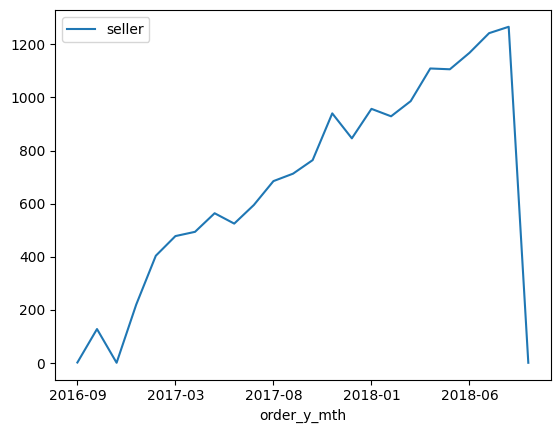

In [155]:
import matplotlib.pyplot as plt
import seaborn as sns

# 먼저 월별로 얼마나 팔렸는지 seller_id 조회
df_sales.groupby(['order_y_mth']).agg(
    seller = ('seller_id', 'nunique')
).plot()
plt.show()

In [156]:
import pandasql as psql

# 월별 상위 판매자 20개 추출
# SQL 쿼리 실행
query = """
with temp_01 as (
    select order_y_mth, seller_id, sum(total_amount) as sum_amount
    from df_sales
    group by 1, 2
    having sum(total_amount) 
),
temp_02 as (
    select *,
        row_number() over (partition by order_y_mth order by sum_amount desc) as rn
    from temp_01
)
select *
from temp_02
where rn <= 20
"""
result = psql.sqldf(query, locals())
# 누적 매출 기준 상위 TOP 5 셀러 추출
top_sellers = result.groupby('seller_id')['sum_amount'].sum().nlargest(5).index
filtered_result = result[result['seller_id'].isin(top_sellers)]

In [157]:
fig = px.line(
    filtered_result,
    x='order_y_mth',
    y='sum_amount',
    color='seller_id',
    title='월별 판매자별 판매액 추이',
    labels={
        'order_y_mth': '주문 월',
        'sum_amount': '판매액 (BRL)',
        'seller_id': '판매자 ID'
    },
    template='plotly_white'
)

fig.update_layout(title_x=0.5)
fig.show()

📊 월별 판매자별 판매액 추이 분석  
주요 인사이트
1. 특정 시점에 급격한 매출 상승한 판매자 존재
- 예: 판매자 A (예: 5324...)는 2017년 8~9월에 급격한 매출 상승을 기록.
- 추정 원인: 이벤트성 프로모션, 시즌 특수, 일시적 인기 상품 등.
- 전략 제안: 해당 셀러의 상품/카테고리/마케팅 활동을 추적하여, 유사 상황에서 타 셀러에게 벤치마킹 전략 적용.

2. 꾸준한 매출 유지 셀러 존재
- 일부 셀러는 월별 진폭이 작고 안정적인 매출 흐름을 보임.
- 추정 원인: 재구매 중심 구조, 고객 충성도 확보, 로지스틱스 최적화 등.
- 전략 제안: 해당 셀러들의 SKU 다양성, 리뷰 평점, 배송 속도 등을 분석해 지속 성장 전략 참고.

3. 셀러 간 매출 편차 존재
- 어떤 셀러는 일시적으로 상위권, 어떤 셀러는 지속적으로 상위권 유지.
- 의미: 셀러마다 시장 내 포지셔닝이 다름.

- 전략 제안:
  - 단발형, 지속형 등으로 셀러 클러스터링
  - 유형별 맞춤 전략 수립 필요